# Data Mining -  Computer Assignment 3
Mohammad Saadati - 
_810198410_

## Introduction
Shopping cart analysis is one of the key techniques used to discover the relationship between items and provides information to understand customer buying behavior. This analysis is done by looking for a combination of items that are often found in transactions.

In this computer assignment, we first examine the data and then move on to extracting **Frequent Itemsets** and **Association Rules**.

## Import Libraries
First of all, we import necessary libraries to use their functions.

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch

plt.rcParams["font.family"] = "serif"

<ipython-input-13-91eba2533f1d>:15: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  dendrogram = sch.dendrogram(sch.linkage(D, method  = 'single'), labels=[1,2,3,4,5])


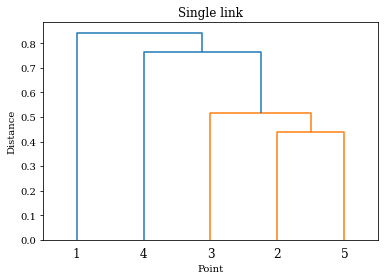

<ipython-input-13-91eba2533f1d>:21: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  dendrogram = sch.dendrogram(sch.linkage(D, method  = "complete"), labels=[1,2,3,4,5])


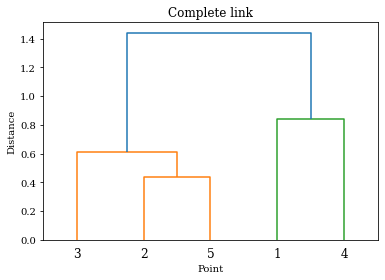

In [13]:
import numpy as np
import scipy.cluster.hierarchy as sch

S = [[1.00, 0.10, 0.41, 0.55, 0.35]
,[0.10, 1.00, 0.64, 0.47, 0.98]
,[0.41, 0.64, 1.00, 0.44, 0.85]
,[0.55, 0.47, 0.44, 1.00, 0.76]
,[0.35, 0.98, 0.85, 0.76, 1.00]]

S = np.array(S)

D = float(1) - S


dendrogram = sch.dendrogram(sch.linkage(D, method  = 'single'), labels=[1,2,3,4,5])
plt.title('Single link')
plt.xlabel('Point')
plt.ylabel('Distance')
plt.show()

dendrogram = sch.dendrogram(sch.linkage(D, method  = "complete"), labels=[1,2,3,4,5])
plt.title('Complete link')
plt.xlabel('Point')
plt.ylabel('Distance')
plt.show()

## Part 1: Preprocessing
Pre-processing is one of the most important steps in data mining projects. Various approaches are used in the field of lost data management and data conversion to other formats, and the careful selection of these approaches has a direct impact on the quality of the final results; Therefore, the best approach should always be identified and applied.

First we load csv file as a DataFrame using pandas library.

In [14]:
diabetic_data = pd.read_csv("./dataset_diabetes/diabetic_data.csv")
diabetic_data

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In this part first we use two Pandas function `isna` and `sum` to count number of missing values at each column.

In [15]:
for column in diabetic_data:
    diabetic_data[column].replace({"?": np.nan}, inplace=True)
    
diabetic_data.isna().sum()

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

The `describe()` function returns descriptive statistics for every column of DataFrame.

In [16]:
diabetic_data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


The `info()` function returns a summary of DataFrame including data type and non-null values count of each column and also memory usage.

In [17]:
diabetic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      99493 non-null   object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    3197 non-null    object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                61510 non-null   object
 11  medical_specialty         51817 non-null   object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

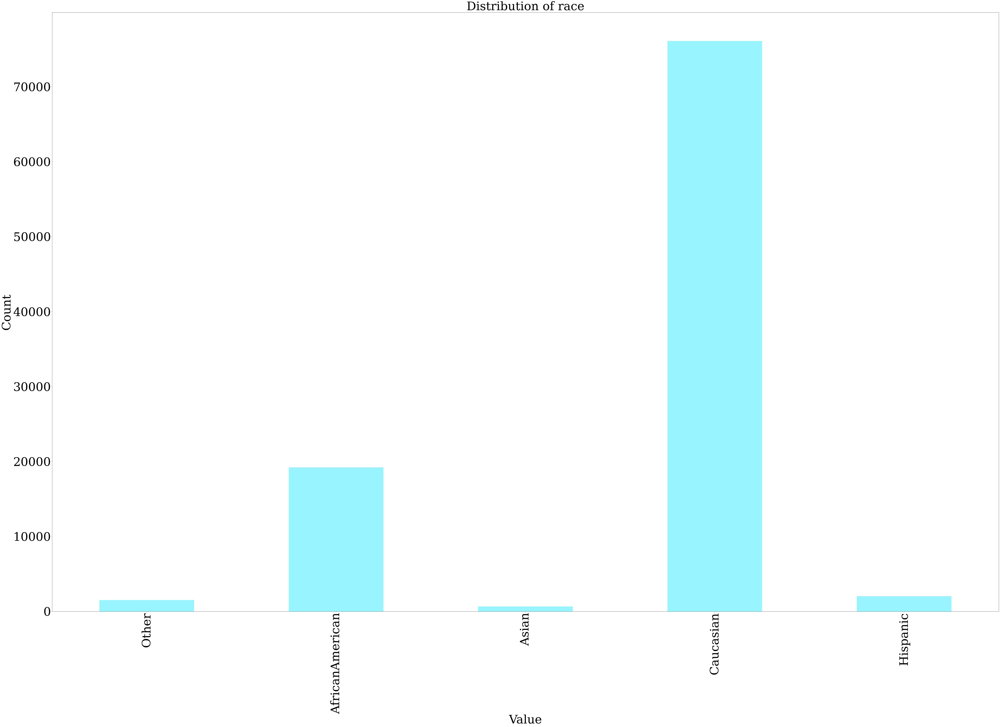

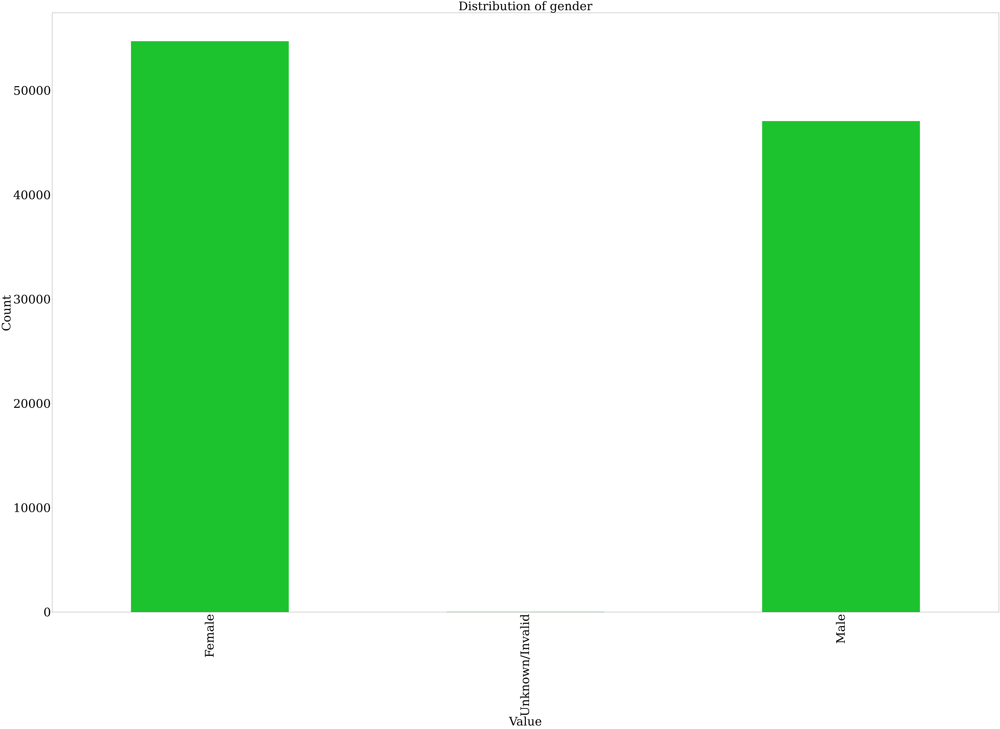

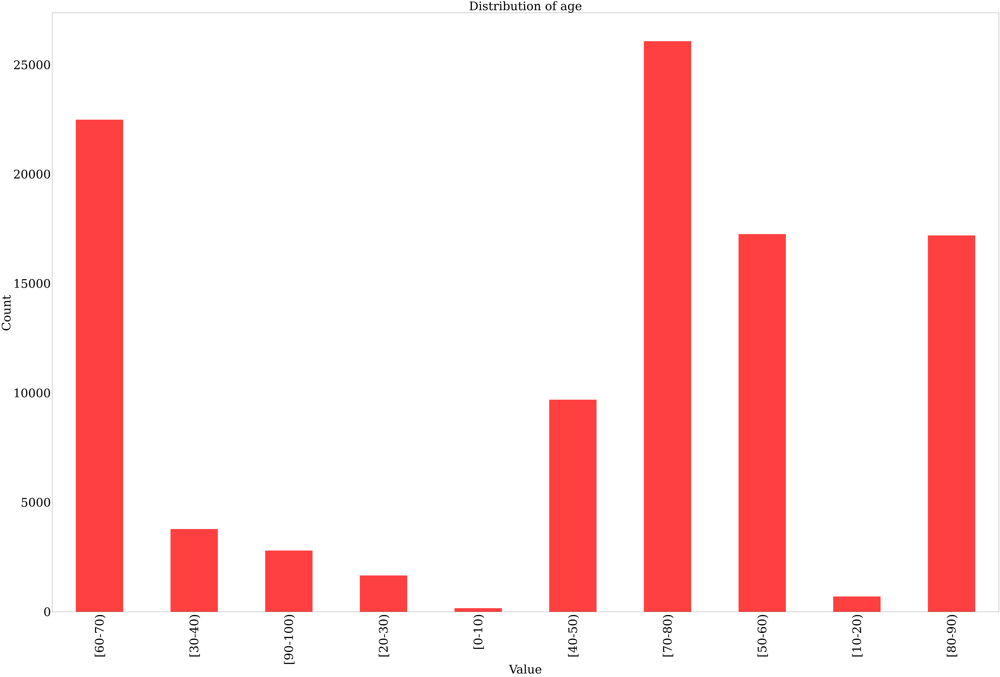

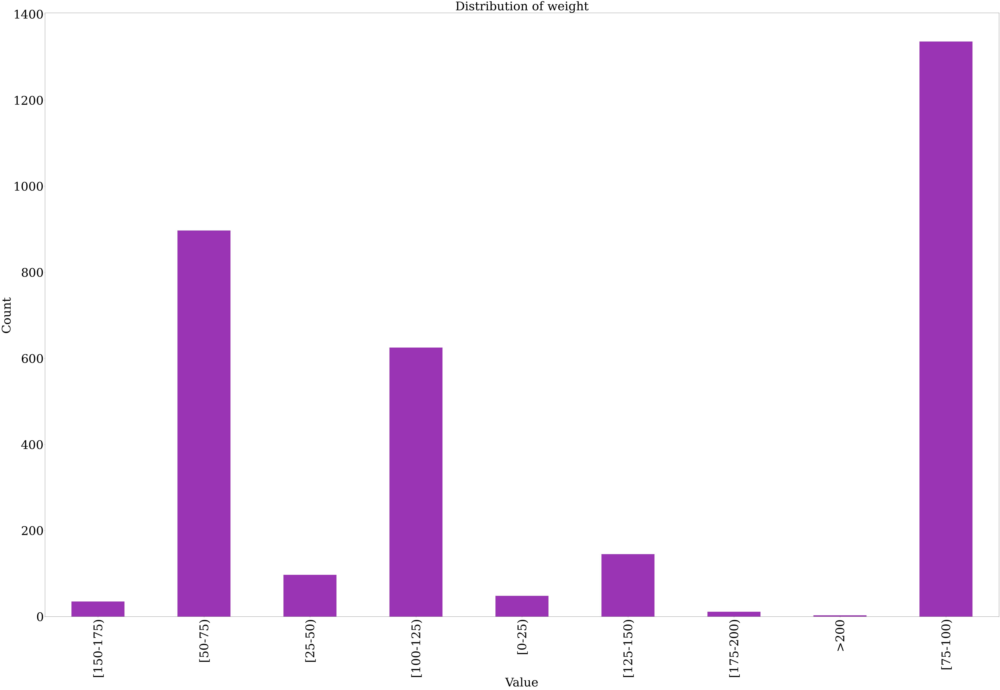

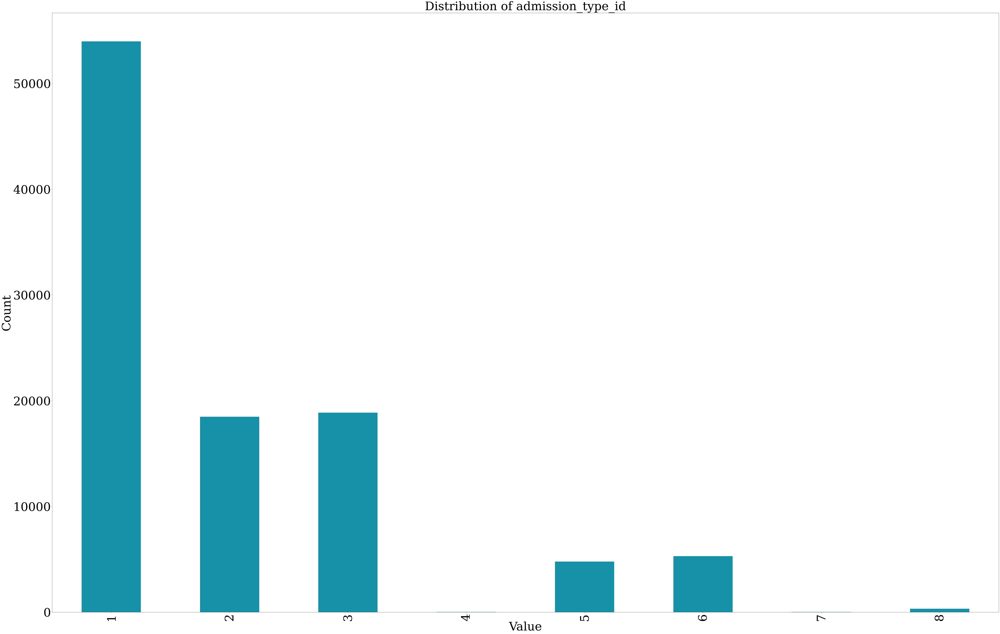

...

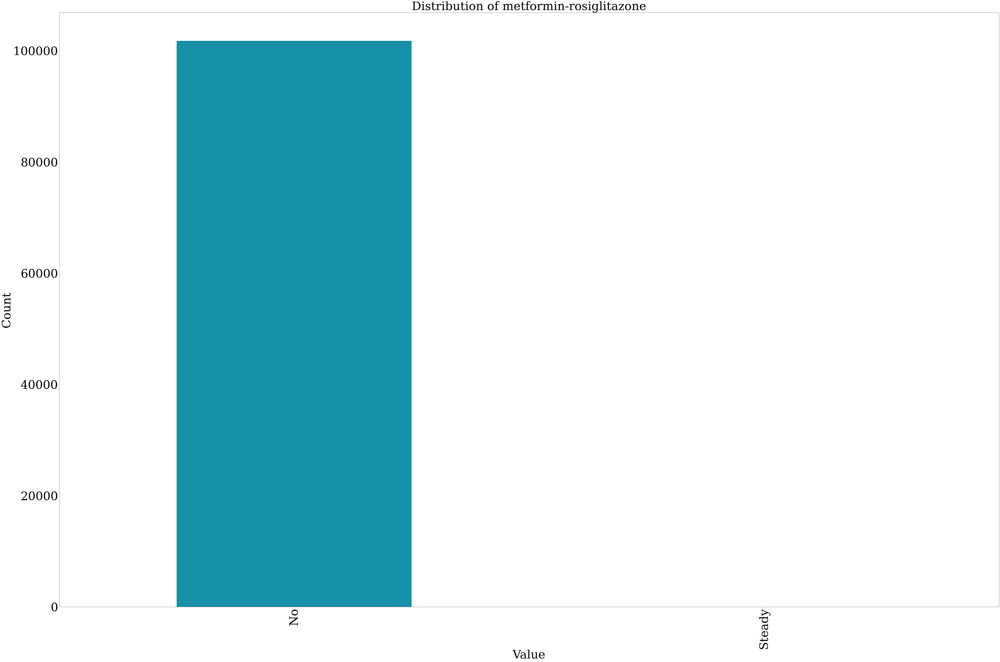

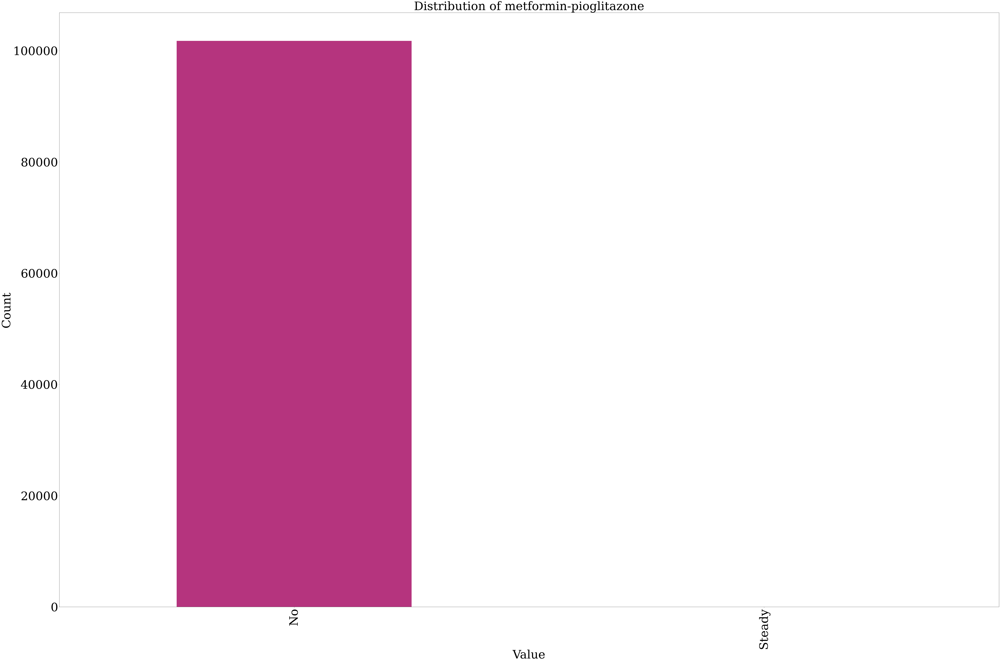

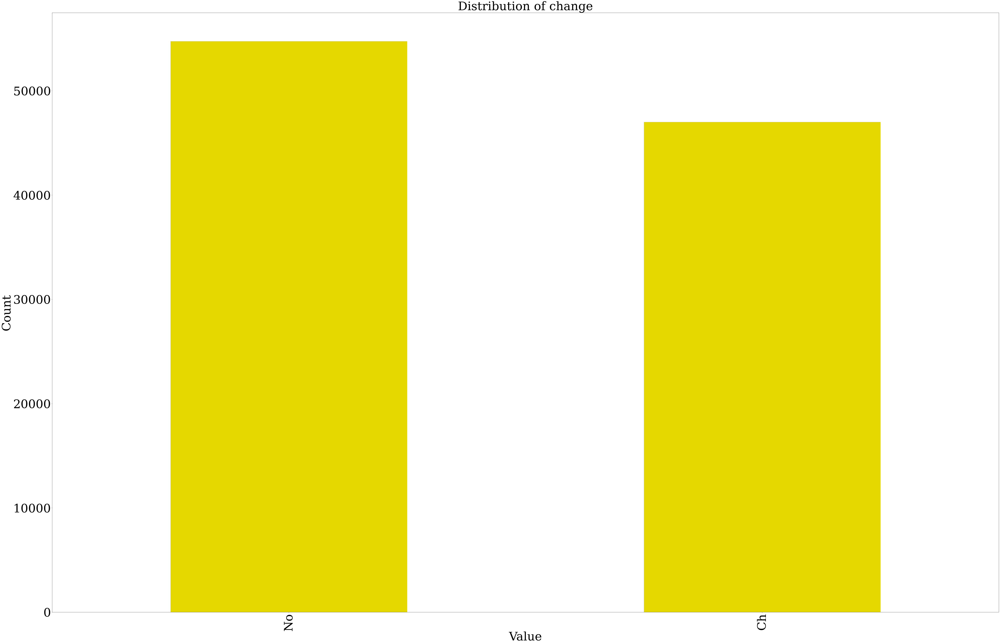

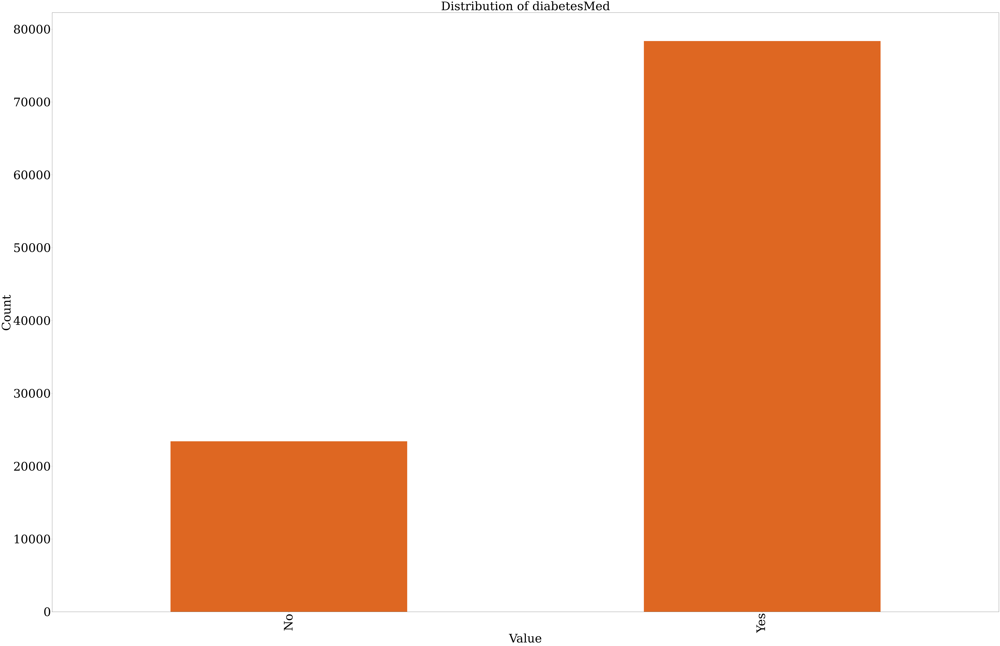

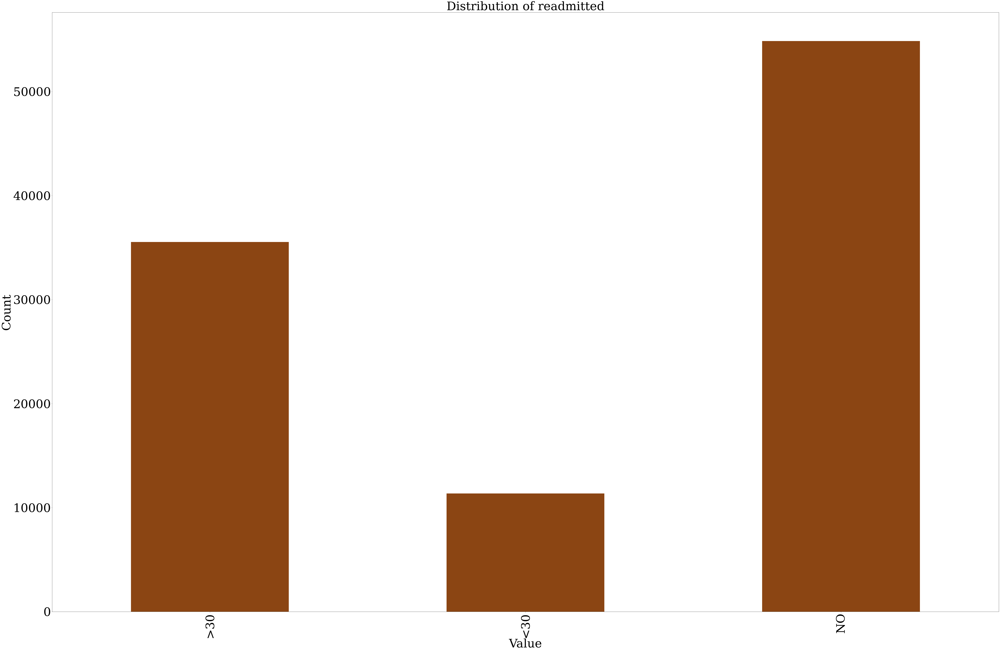

In [20]:
counter = 0
colors = ['#98f5ff', '#1cc32f', '#FF4040', '#9a34b5', '#1691a7', '#b5347e', '#e5d700', '#de6722', '#8B4513', '#C1FFC1'
          , '#ae8b0c', '#ff796c'] 

bad_columns = ["encounter_id", "patient_nbr", "diag_1", "diag_2", "diag_3"]

for column in diabetic_data:
    if column not in bad_columns:
        diabetic_data[column].value_counts(sort=False).plot.bar(color = colors[counter % 12],figsize=(100,65),fontsize=70)
        plt.xlabel("Value",fontsize=70) 
        plt.ylabel("Count",fontsize=70) 
        plt.title("Distribution of " + column,fontsize=70) 
        plt.show()
        counter += 1